# Analisis de Redes.

## Comparación de disciplinas de servicio.

Al concluir el análisis de la cola $M/G/1-FIFO$ se planteó la pregunta de qué cambia si utilizamos otras disciplinas de servicio. En particular discutimos y consideramos:

* LIFO con y sin interrupción de servicio.
* Processor Sharing (repartir por igual la capacidad entre los presentes)
* SRPT (atender siempre al trabajo más corto).

Abajo se incluyen los códigos que implementan estas disciplinas y una breve discusión de resultados. En todos los casos lo testeamos con $\rho=0.8$ y distribución de trabajos Gamma de diferentes varianzas.

In [1]:
#using Pkg; Pkg.instantiate(); Pkg.update()

In [2]:
using Distributions, Plots, LaTeXStrings, Random
default(size=(1000,500),legendfontsize=11, legend=:topleft)

### Código original $M/G/1 - FIFO$

In [3]:
function simula_MG1(lambda,trabajos,Tfinal)
    
    #lambda: tasa de arribos del p. poisson
    #trabajos: distribucion de la cual sortear trabajos (e.g. exponencial, gamma)
    #Tfinal: tiempo de simulacion
    
    arribos = Exponential(1/lambda)
    
    x=0;
    t=0.0;
    
    #trabajo remanente del que está en servicio
    r=0.0;
    
    T=[t];
    X=[x];
    
    #vector donde guardo los trabajos
    W=Float64[]
    
    nextArr = rand(arribos)
    nextDep = Inf;
    
    dt,caso = findmin([nextArr,nextDep])
    
    while t<Tfinal
        
        t=t+dt
        nextArr = nextArr-dt
        nextDep = nextDep-dt
        
        if x>0
            W[1] = W[1]-dt   #FIFO: atiendo al primero
        end
        
        if caso==1 ##arribo
            
            x=x+1
            nuevoW = rand(trabajos)
            push!(W,nuevoW)  #FIFO: todo el que llega lo pongo al final
            nextArr = rand(arribos)
            
        elseif caso==2 ##partida
            
            x=x-1
            W=W[2:end]       #FIFO: cuando se va, se va el primero.
        end
        
        if x>0
            nextDep=W[1]
        else
            nextDep=Inf
        end
        
        push!(T,t)
        push!(X,x)
        
        dt,caso = findmin([nextArr,nextDep])
        
    end
    
    return T,X
end  

simula_MG1 (generic function with 1 method)

### Distribuciones de prueba, tipo Gamma con diferentes varianzas.

In [4]:
d1 = Gamma(10,0.1)  #alpha 10, cv2 = 0.1
d2 = Gamma(1.0,1.0)  #dist. exponencial, cv2=1.0
d3 = Gamma(0.1,10)  #alpha 0.1, cv2=10

lambda=0.8
Tfinal = 10000
rho1=lambda*mean(d1)
rho2=lambda*mean(d2)
rho3 = lambda*mean(d3)
println("Cargas: $rho1, $rho2, $rho3")

Cargas: 0.8, 0.8, 0.8


In [5]:
function ocupacion_media(T,X)
    return sum(X[1:end-1].*diff(T))/T[end]
end

ocupacion_media (generic function with 1 method)

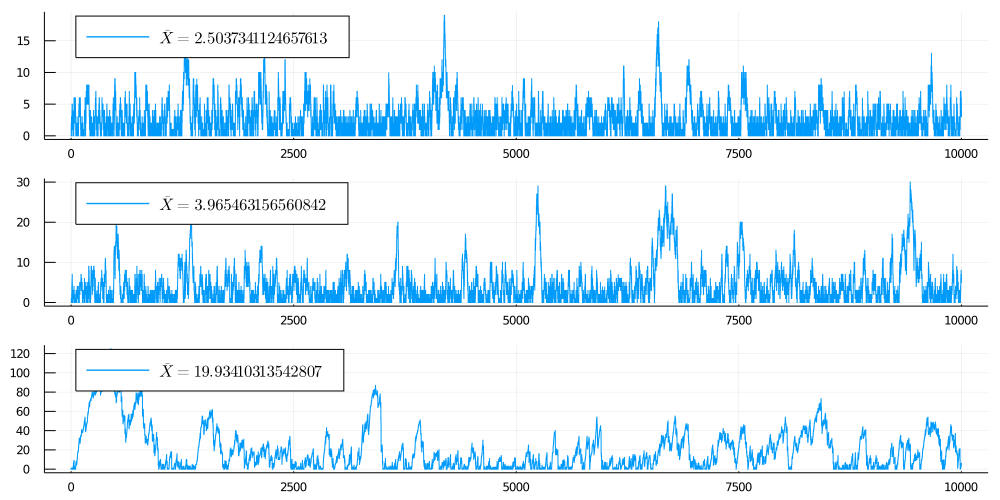

In [6]:
T1,X1  = simula_MG1(lambda,d1,Tfinal)
T2,X2  = simula_MG1(lambda,d2,Tfinal)
T3,X3  = simula_MG1(lambda,d3,Tfinal)

Xhat1 = ocupacion_media(T1,X1)
Xhat2 = ocupacion_media(T2,X2)
Xhat3 = ocupacion_media(T3,X3)

plot([(T1,X1), (T2,X2), (T3,X3)], layout=(3,1), plot_title="FIFO", lt=:steppost, label=[L"\bar{X} = %$Xhat1" L"\bar{X} = %$Xhat2" L"\bar{X} = %$Xhat3"])

### Observaciones

Como discutimos en clase, la fórmula de Pollaczek-Khinchin predice que en el caso FIFO, a medida que aumenta la varianza de los trabajos peor es el desempeño. 

## El caso LIFO

In [7]:
function simula_MG1_LIFO(lambda,trabajos,Tfinal)
    
    #lambda: tasa de arribos del p. poisson
    #trabajos: distribucion de la cual sortear trabajos (e.g. exponencial, gamma)
    #Tfinal: tiempo de simulacion
    
    arribos = Exponential(1/lambda)
    
    x=0;
    t=0.0;
    
    #trabajo remanente del que está en servicio
    r=0.0;
    
    T=[t];
    X=[x];
    
    #vector donde guardo los trabajos
    W=Float64[]
    
    nextArr = rand(arribos)
    nextDep = Inf;
    
    dt,caso = findmin([nextArr,nextDep])
    
    while t<Tfinal
        
        t=t+dt
        nextArr = nextArr-dt
        nextDep = nextDep-dt
        
        if x>0
            W[1] = W[1]-dt   #LIFO: atiendo al que está al frente de la cola.
        end
        
        if caso==1 ##arribo
            
            x=x+1
            nuevoW = rand(trabajos)
            pushfirst!(W,nuevoW)  #LIFO: todo el que llega lo pongo al principio!
            nextArr = rand(arribos)
            
        elseif caso==2 ##partida
            
            x=x-1
            W=W[2:end]            #LIFO: como el que está en servicio es el primero, es éste el que se va.
        end
        
        if x>0
            nextDep=W[1]
        else
            nextDep=Inf
        end
        
        push!(T,t)
        push!(X,x)
        
        dt,caso = findmin([nextArr,nextDep])
        
    end
    
    return T,X
end


simula_MG1_LIFO (generic function with 1 method)

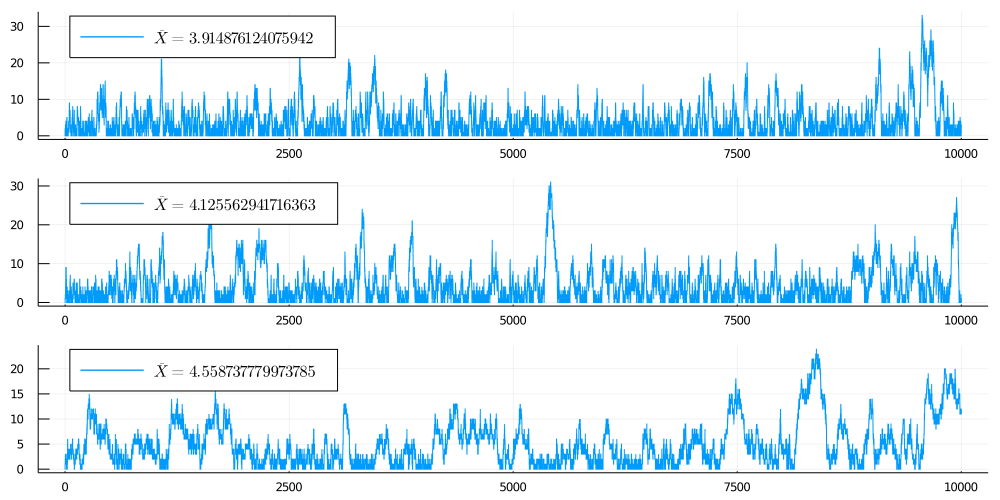

In [8]:
T1,X1  = simula_MG1_LIFO(lambda,d1,Tfinal)
T2,X2  = simula_MG1_LIFO(lambda,d2,Tfinal)
T3,X3  = simula_MG1_LIFO(lambda,d3,Tfinal)

Xhat1 = ocupacion_media(T1,X1)
Xhat2 = ocupacion_media(T2,X2)
Xhat3 = ocupacion_media(T3,X3)

plot([(T1,X1), (T2,X2), (T3,X3)], layout=(3,1), plot_title="FIFO", lt=:steppost, label=[L"\bar{X} = %$Xhat1" L"\bar{X} = %$Xhat2" L"\bar{X} = %$Xhat3"])

### Observaciones

En este caso, el desempeño se iguala para las tres distribuciones. De hecho puede probarse que esta disciplina *con interrupciones* es insensible a la distribución de los trabajos (siempre anda igual que si fueran exponenciales).

En caso que *no se interrumpe* (solo se coloca el último que llega al principio de la cola, pero no desplaza a quien está en servicio, entonces esta ventaja desaparece, pudiendo quedar atrás de trabajos largos como en FIFO.

## El caso Processor Sharing

En esta disciplina, si hay $x$ personas en el sistema, cada uno se lleva $1/x$ del tiempo de servicio.

In [9]:
function simula_MG1_PS(lambda,trabajos,Tfinal)
    
    #lambda: tasa de arribos del p. poisson
    #trabajos: distribucion de la cual sortear trabajos (e.g. exponencial, gamma)
    #Tfinal: tiempo de simulacionc
    
    arribos = Exponential(1/lambda)
    
    x=0;
    t=0.0;
       
    T=[t];
    X=[x];
   
    #vector donde guardo los trabajos
    W=Float64[]
    j=NaN
    nextArr = rand(arribos)
    nextDep = Inf;
    
    dt,caso = findmin([nextArr,nextDep])
    
    while t<Tfinal
        
        t=t+dt
        nextArr = nextArr-dt
        nextDep = nextDep-dt
        
        if x>0
            W = W .- (dt/x) #Processor sharing: restamos el tiempo de trabajo repartido a todos los que estan.
        end
        
        if caso==1 ##arribo
            
            x=x+1
            nuevoW = rand(trabajos)
            push!(W,nuevoW) #lo ponemos al final, pero da lo mismo
            nextArr = rand(arribos)
            
        elseif caso==2 ##partida

            deleteat!(W,j) #borramos el j, que es el que se iba a ir
            x=x-1
        end
        
        if x>0
            
            nextDep,j = findmin(W*x) #guardo cuando es la proxima partida y quien es el candidato (j).
        else
            nextDep=Inf
            j=NaN                    #j no está definido si no hay nadie.
        end
        
        push!(T,t)
        push!(X,x)
             
        dt,caso = findmin([nextArr,nextDep])
        
    end
    
    return T,X
end

simula_MG1_PS (generic function with 1 method)

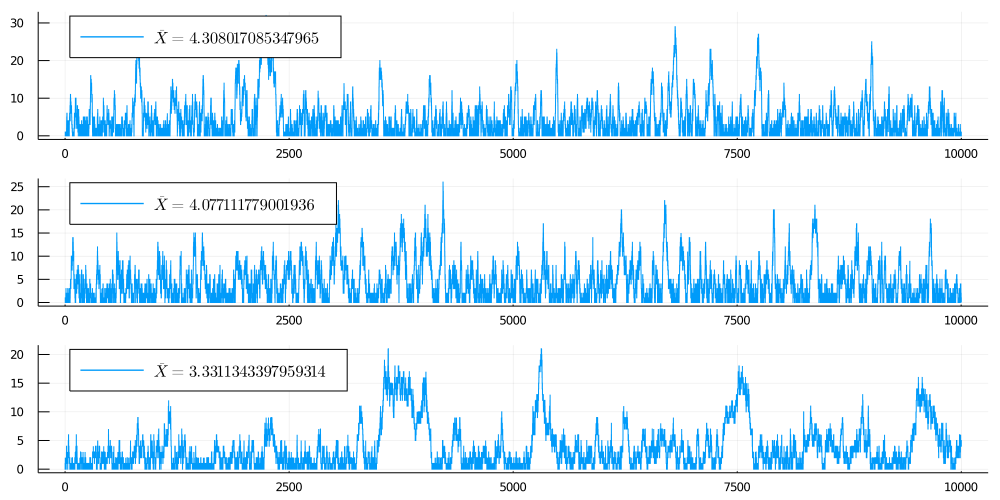

In [10]:
T1,X1  = simula_MG1_PS(lambda,d1,Tfinal)
T2,X2  = simula_MG1_PS(lambda,d2,Tfinal)
T3,X3  = simula_MG1_PS(lambda,d3,Tfinal)

Xhat1 = ocupacion_media(T1,X1)
Xhat2 = ocupacion_media(T2,X2)
Xhat3 = ocupacion_media(T3,X3)

plot([(T1,X1), (T2,X2), (T3,X3)], layout=(3,1), plot_title="FIFO", lt=:steppost, label=[L"\bar{X} = %$Xhat1" L"\bar{X} = %$Xhat2" L"\bar{X} = %$Xhat3"])

### Observaciones

Nuevamente, esta disciplina que atiende a todos al mismo tiempo es *insensible* a la distribución de los trabajos, por lo que resulta más robusta a la hora de compartir la capacidad de servicio. Además no hay "retardo de cola" ya que todos se atienden simultáneamente.

## El caso SRPT

En este caso se atiende siempre al trabajo que le falta menos para terminar (interrumpiendo el servicio si llega uno más corto).

In [11]:
function simula_MG1_SRPT(lambda,trabajos,Tfinal)
    
    #lambda: tasa de arribos del p. poisson
    #trabajos: distribucion de la cual sortear trabajos (e.g. exponencial, gamma)
    #Tfinal: tiempo de simulacion
    
    arribos = Exponential(1/lambda)
    
    x=0;
    t=0.0;
    
    #trabajo remanente del que está en servicio
    r=0.0;
    
    T=[t];
    X=[x];
    
    #vector donde guardo los trabajos
    W=Float64[]
    
    nextArr = rand(arribos)
    nextDep = Inf;
    
    dt,caso = findmin([nextArr,nextDep])
    
    while t<Tfinal
        
        t=t+dt
        nextArr = nextArr-dt
        nextDep = nextDep-dt
        
        if x>0
            W[1] = W[1]-dt   #SRPT: atiendo al que está al frente de la cola.
        end
        
        if caso==1 ##arribo
            
            x=x+1
            nuevoW = rand(trabajos)
            push!(W,nuevoW)  #SRPT: todo el que llega lo agrego a la cola. No importa el lugar ya despues se reordena!
            nextArr = rand(arribos)
            
        elseif caso==2 ##partida
            
            x=x-1
            W=W[2:end]       #SRPT: como el que está en servicio es el primero, es éste el que se va.
        end
        
        if x>0
            W=sort(W)        #SRPT: si todavía hay gente, la ordeno de menor a mayor. En W[1] siempre queda el mas corto.
            nextDep=W[1]
        else
            nextDep=Inf
        end
        
        push!(T,t)
        push!(X,x)
        
        dt,caso = findmin([nextArr,nextDep])
        
    end
    
    return T,X
end


simula_MG1_SRPT (generic function with 1 method)

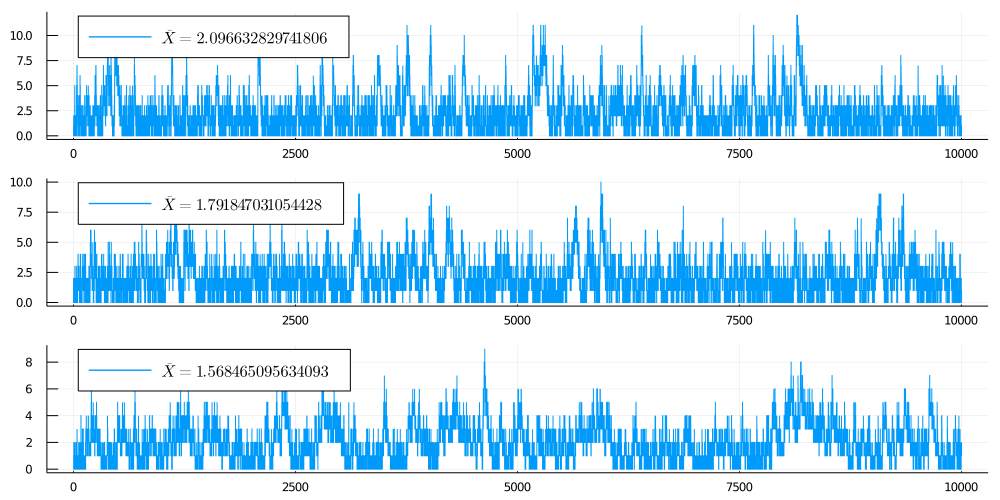

In [12]:
T1,X1  = simula_MG1_SRPT(lambda,d1,Tfinal)
T2,X2  = simula_MG1_SRPT(lambda,d2,Tfinal)
T3,X3  = simula_MG1_SRPT(lambda,d3,Tfinal)

Xhat1 = ocupacion_media(T1,X1)
Xhat2 = ocupacion_media(T2,X2)
Xhat3 = ocupacion_media(T3,X3)

plot([(T1,X1), (T2,X2), (T3,X3)], layout=(3,1), plot_title="FIFO", lt=:steppost, label=[L"\bar{X} = %$Xhat1" L"\bar{X} = %$Xhat2" L"\bar{X} = %$Xhat3"])

### Observaciones

Como vemos, este sistema es el que opera más vacío para todas las distribuciones. En el primer caso, FIFO anda cerca, ya que si todos los trabajos son del mismo tamaño, entonces el que llega primero se atiende y se vuelve el más corto. Quiere decir que para trabajos determinísticos SRPT es óptimo, y FIFO también. En los demás casos, SRPT gana abiertamente, a expensas de ser injusto con los trabajos largos.